<a href="https://colab.research.google.com/github/astrapi69/DroidBallet/blob/master/Kopie_von_DLG_D3_4_E2_Transfer_Learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<center><a target="_blank" href="https://academy.constructor.org/"><img src="https://jobtracker.ai/static/media/constructor_academy_colour.b86fa87f.png" width="200" style="background:none; border:none; box-shadow:none;" /></a> </center>

_____
<center> <h1>  </h1> </center>
<center> <h1> Deep Learning & Tensorflow: CNN Tutorial with Transfer Learning (Helper Notebook 2) </h1> </center>

<p style="margin-bottom:1cm;"></p>

_____

<center>Constructor Academy, 2024</center>


# Helper Notebook 2

__Part 2: Transfer Learning and Retraining ResNet-50 with ETHEC dataset__


## Introduction

Recall that the predictions on our previous notebook using the vanilla ResNet-50 was terrible.



![Wrong butterflies](https://drive.google.com/uc?id=1RPl7iZwcXrkh7RY7_613jLgDO5QUhOT1)



The pretrained model performed poorly for classifying images from the ETHEC butterfly dataset. This happens because the pretrained model was trained on the `ImageNet` dataset which is not labelled with the specific classes that we want to predict and does not contain many images of our objects, the butterflies.

The lower layers of a Convolutional Neural Network can recognize many different shapes or features in an image. It is the last few fully-connected layers that features are combined into classifying a whole image. So we can try and re-route the output of the last convolutional layer of the model to a new fully-connected neural network that we create for doing classification on the ETHEC dataset.



## Task

In part 1, we coded up a ResNet-50 model with imagenet weights that have been pretrained on the imagenet dataset. We made no alterations to the model and had not train the model on our dataset. The predictions were underwhelming to say the least.

Lets fix that!

In this notebook, we will run a  Resnet 50 model and train it with our butterfly dataset (transfer learning) and try different parameters to see how our model improves.

- data augmentation
    - zoom
    - horizontal and vertical flip
    - rotation

- Max and Min.
 number of training examples per class

- tackling  dataset imbalance

- try predicting lower levels of the hierarchy species

## Import Libraries

In [2]:
import os
import glob
import numpy as np
import pandas as pd

from datetime import datetime

# #------------tensorboard libraries--------------
!pip install -U tensorboard_plugin_profile

import tensorflow_datasets as tfds
tfds.disable_progress_bar()

# #------------tensoflow libraries-----------------
import tensorflow as tf
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.optimizers import Adam

# print('tensorflow version: ', tf.__version__)
# print('GPUs available: {}'.format(tf.config.list_physical_devices('GPU')))

## Choose Runtime

Make sure that you are connected to a GPU (Runtime -> Change Runtime Type -> GPU). Otherwise, the training will be very slow.

In [3]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Wed Mar 20 16:14:02 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   46C    P8              12W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

## Load data and helper functions

Follow these steps:
- Go to this folder: https://drive.google.com/drive/folders/13PXDXMEtVSkfY25rS-yhGgF8BhwtQ6Y4?usp=sharing
- Make a copy of the file `butterflies.zip` and move it to your own Google Drive. Rename it to `butterflies.zip`.
- Right click -> share -> change permission to 'Anybody with the link...' -> Copy the link
- From this link extract the file id and replace it in the code cell below.

In [4]:
!pip install gdown

In [5]:
!gdown --id 13ImSEBk74HST4AUvhAjzIC4DwL0V4UOz -O butterflies_sample.zip

/usr/local/lib/python3.10/dist-packages/gdown/cli.py:138: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=13ImSEBk74HST4AUvhAjzIC4DwL0V4UOz
From (redirected): https://drive.google.com/uc?id=13ImSEBk74HST4AUvhAjzIC4DwL0V4UOz&confirm=t&uuid=6dfaaa53-d181-4b9a-b393-3a204ab564a4
To: /content/butterflies_sample.zip
100% 1.75G/1.75G [00:47<00:00, 36.8MB/s]


In [7]:
!unzip butterflies_sample.zip

Die letzten 5000 Zeilen der Streamingausgabe wurden abgeschnitten.
  inflating: butterflies/images/2017_05_24R/ETHZ_ENT01_2017_05_24_034253.JPG  
  inflating: butterflies/images/2017_05_24R/ETHZ_ENT01_2017_05_24_034247.JPG  
  inflating: butterflies/images/2017_05_24R/ETHZ_ENT01_2017_05_24_034521.JPG  
  inflating: butterflies/images/2017_05_24R/ETHZ_ENT01_2017_05_24_034509.JPG  
  inflating: butterflies/images/2017_05_24R/ETHZ_ENT01_2017_05_24_034482.JPG  
  inflating: butterflies/images/2017_05_24R/ETHZ_ENT01_2017_05_24_034496.JPG  
  inflating: butterflies/images/2017_05_24R/ETHZ_ENT01_2017_05_24_034441.JPG  
  inflating: butterflies/images/2017_05_24R/ETHZ_ENT01_2017_05_24_034327.JPG  
  inflating: butterflies/images/2017_05_24R/ETHZ_ENT01_2017_05_24_034333.JPG  
  inflating: butterflies/images/2017_05_24R/ETHZ_ENT01_2017_05_24_034455.JPG  
  inflating: butterflies/images/2017_05_24R/ETHZ_ENT01_2017_05_24_034469.JPG  
  inflating: butterflies/images/2017_05_24R/ETHZ_ENT01_2017_05_2

In [8]:
!ls

butterflies  butterflies_sample.zip  sample_data


In [9]:
import butterflies.helper_cnn as hp

In [10]:
def df_from_json(json_path, image_path):
  tdf = pd.read_json(json_path, orient='index')
  tdf['image_name'] = tdf['image_path'] + '/' + tdf['image_name']
  tdf['species'] = tdf['genus'] + '_' + tdf['specific_epithet']

  image_path = os.path.join(image_path, '')
  list_image_paths = glob.glob(image_path+'*/*.JPG')
  list_image_paths = [x.replace(image_path,'') for x in list_image_paths]
  check_image_bool = tdf['image_name'].apply(lambda x: x in list_image_paths)
  tdf = tdf[check_image_bool]

  print('loaded {}.json with shape {}'.format(json_path, tdf.shape))
  return tdf

In [11]:
images_dir = "butterflies/images"

df_train_all = df_from_json("butterflies/splits/train.json", images_dir)
df_val_all = df_from_json("butterflies/splits/val.json", images_dir)
df_test_all = df_from_json("butterflies/splits/test.json", images_dir)

loaded butterflies/splits/train.json.json with shape (21928, 16)
loaded butterflies/splits/val.json.json with shape (2979, 16)
loaded butterflies/splits/test.json.json with shape (3165, 16)


## Modeling: Pre-Trained Model-ResNet-50

Lets define what we have to do before we write up any code. We should have a clear understanding of what we want to achieve and how to get there.

__Steps:__

1. Create Model instance
2. Define input size
3. Data Generation
   - Data Sampling
   - Data Agumentation
4. Defining class weights
5. Create Model instance
6. Unlocking layers for training
7. Putting everything together
8. Model evaluation


## Data Generation

In this section, we will generate our data for training and testing.

In [12]:
# limiting the model to only train on and predict 'family' of butterflies

x_col = 'image_name' # column in the df with local paths to images
y_col = "family" # column in the df with the names of the classes

print("'{}' column contains {} unique classes".format(y_col,df_train_all[y_col].unique().shape[0] ))

'family' column contains 6 unique classes


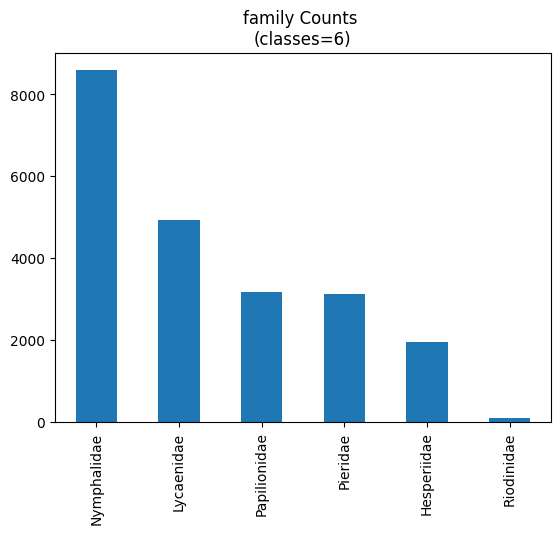

In [13]:
hp.plot_class_balances(df_train_all,y_col)

Looks like our train data classes is horribly imbalanced. Lets fix that.

### Data Sampling

This function allows you to upsample, downsample and/or balance your dataset. You can try experimenting with different numbers of images per class and different balanced or unbalanced datasets.

- df: dataframe to sample
- col_name: (string) name of column with the classes to use for samping and balancing
- n_sample_per_class: (int) max number of samples to take for each class
- replace: (bool) create duplicates to balance the classes (upsample)

In [14]:
max_train_pics = 500
max_train_val_pics = int(.2 * max_train_pics)

df_train = hp.sample_df(df_train_all,
                      y_col,
                      n_sample_per_class=max_train_pics,
                      replace = False
                      )


# df_test = hp.sample_df(df_test_all,
#                       y_col,
#                       n_sample_per_class=max_train_val_pics,
#                       replace = False
#                       )
df_test = df_test_all


# df_val = hp.sample_df(df_val_all,
#                       y_col,
#                       n_sample_per_class=max_train_val_pics,
#                       replace = False
#                       )
df_val = df_val_all

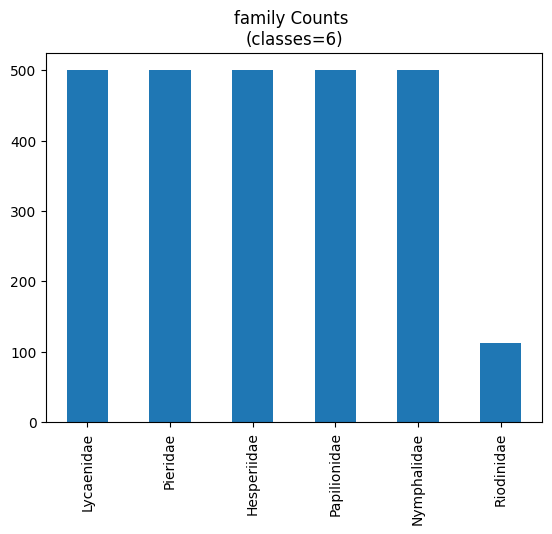

In [15]:
hp.plot_class_balances(df_train, y_col)

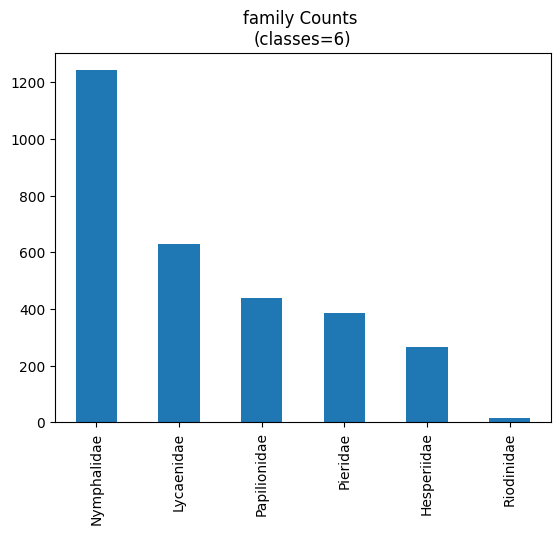

In [16]:
hp.plot_class_balances(df_val, y_col)

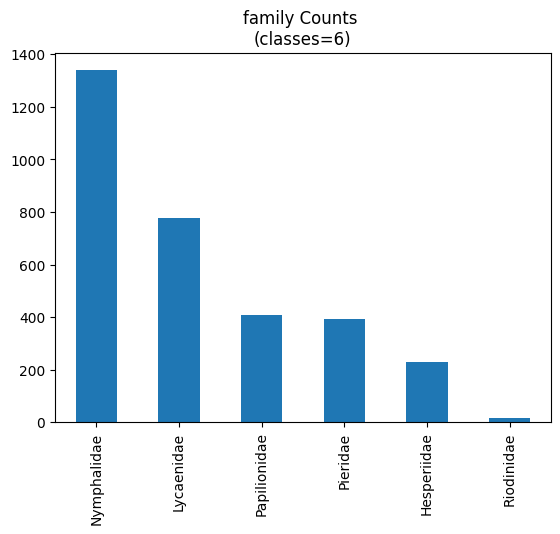

In [17]:
hp.plot_class_balances(df_test, y_col)

### Data Augmentation

####    _"**Data-augmentation is key** to the training of neural networks for image classification"_ <sup>(1)</sup>

Training CNN's for accurate predictions requires a lot of image data. Usually there is never enough images to cope with all of the variability that the classifier might encounter while also preventing overfitting.

The smart solution to this is to randomly augment, or edit, the images just before they are passed to the network for training. This allows us to create a theoretically infinite amount of images and also generalise the model's behaviour.

The most common transformations are as follows: <sup>(2)</sup>
- Shifting the image by a certain number of pixels
horizontally or vertically
- Rotating the image
- Changing its brightness
- Changing the zoom
- Changing the contrast
- Shearing the image

Refer to the Documentation of ImageDataGenerator for choosing value of arguments:
https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator

In [18]:
IMG_SIZE = 224
batch_size = 32

#need to pass the class names to the .flow_from_dataframe method
train_classes = df_train[y_col].unique()
train_classes = np.sort(train_classes).tolist()

datagen_train=tf.keras.preprocessing.image.ImageDataGenerator(
                      rescale=1./255,
                      rotation_range=15,
                      width_shift_range=0.2,
                      height_shift_range=0.2,
                      shear_range=0.005,
                      zoom_range=[0.9, 1.4],
                      horizontal_flip=True,
                      vertical_flip=False,
                      brightness_range=(.8,1.2),
                      fill_mode='nearest',
                      )

train_generator=datagen_train.flow_from_dataframe(
    dataframe=df_train,
    directory=images_dir,
    shuffle=True,
    x_col=x_col,
    y_col=y_col,
  # save_to_dir=savepath + '/aug_images',
    classes=train_classes,
    class_mode='sparse',
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=batch_size)

Found 2612 validated image filenames belonging to 6 classes.


The data-generator will return a tensor with the images converted to tensors and the true classes for each batch of images

The batch-size that can be loaded is limited by the amount of RAM on the GPU. Higher batch sizes will train faster but setting the batch size too high will cause a memory error. (If you get an error during training try using smaller batches).

We also need a data-generator for the val-set and the test-set, but this should not do any transformations to the images because we want to know the exact classification accuracy on those specific images. So we just rescale the pixel-values so they are between 0.0 and 1.0 because this is expected by the
model.

In [19]:
datagen_val=tf.keras.preprocessing.image.ImageDataGenerator(
                      rescale=1./255
                      )

val_generator=datagen_val.flow_from_dataframe(
    dataframe=df_val,
    directory=images_dir,
    x_col=x_col,
    y_col=y_col,
    class_mode='sparse',
    classes=train_classes,
    shuffle=False,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=batch_size)

test_generator = datagen_val.flow_from_dataframe(
    dataframe=df_test,
    directory=images_dir,
    x_col=x_col,
    y_col=y_col,
    class_mode='sparse',
    classes=train_classes,
    shuffle=False,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=batch_size)

Found 2979 validated image filenames belonging to 6 classes.
Found 3165 validated image filenames belonging to 6 classes.


#### Viewing the Image Augmentatoin

We can save the randomly transformed images during training, or access the next batch as numpy arrays, to inspect whether they have been overly distorted, so we have to adjust the parameters for the data-generator above.

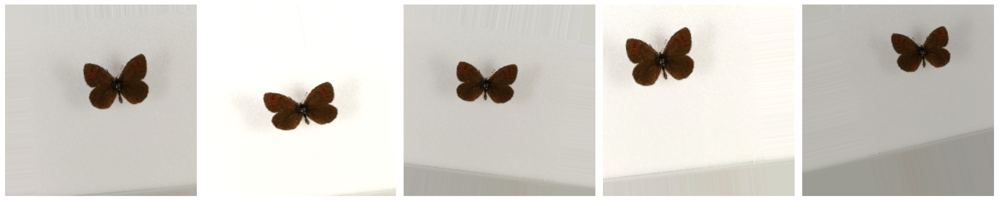

In [20]:
# Plot 5 augmentations of 1st image in train generator
augmented_images = [train_generator[0][0][0] for i in range(5)]
hp.plotImages(augmented_images)

train_generator[0][0][0]

- Number of train generator = (train_generator.n / batch_size) --> 22.25 ->23
- train_generator[0] --> first generator
- each generator is tuple with list(images_arr) and list(classes)
- train_generator[0][0] --> list(images_arr)
- train_generator[0][0][0] --> first image_arr

next(train_generator)
- next(train_generator) -> selects a generator which is tuple with list(images_arr) and list(classes)
- sample_training_images -> will contain list(images_arr)

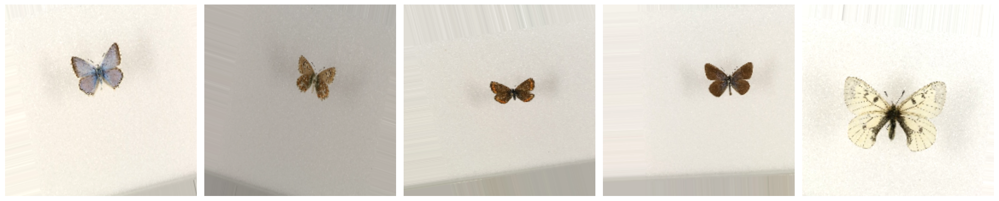

In [21]:
# Plot 5 images from the train generator
sample_training_images, _ = next(train_generator)
hp.plotImages(sample_training_images[:5])

#### Defining steps size

Because the data-generators will loop for eternity, we need to specify the number of steps to perform during evaluation and prediction on the test-set. If our test-set contained 30 images and the batch-size was set to 10, the number of steps needed would be 3 for one full processing of the test-set.


**steps_test** - The steps_test below is used in **validation_steps** in fit_generator below. This is similar to **steps_per_epoch** i.e. the number of batch iterations before a training epoch is considered finished.

In [22]:
# Since the step_size can not be in decimal places. It has been rounded

steps_train = round(train_generator.n / batch_size)
steps_val = round(val_generator.n / batch_size)
steps_test = round(test_generator.n / batch_size)

In [23]:
# Get the class-numbers for all the images in the training- and test-sets

cls_train = train_generator.classes
cls_test = test_generator.classes
len(cls_train)

2612

## Class weights

In dataset Sampling section above we have set the number of images used for training purpose. And the dataset is quite balanced,when using smaller samples, which might not be the case in a pratical setting. eg.See the actual distribution of data. As you all know, imbalanced datasets can cause a problem during training because the neural network will be shown many more examples high frequent class, so it might become better at recognizing only that class.

scikit-learn can be used to calculate weights that will properly balance any dataset. These weights are applied to the gradient for each image in the batch during training, so as to scale their influence on the overall gradient for the batch.

Note: Increase the max_train_pics in later iterations and see effect of more data in which case also use compute_class_weight to solve for imbalance.

For more information on class_weight please look at

https://towardsdatascience.com/practical-tips-for-class-imbalance-in-binary-classification-6ee29bcdb8a7

In [ ]:
from sklearn.utils.class_weight import compute_class_weight
class_weight = compute_class_weight(class_weight='balanced',
                                    classes=np.unique(cls_train),
                                    y=cls_train)
class_weight

array([0.87066667, 0.87066667, 0.87066667, 0.87066667, 0.87066667,
       3.88690476])

In [ ]:
# class_weight has to be a dictionary format

class_weight_dict = { i : class_weight[i] for i in range(0, len(class_weight) ) }
class_weight_dict

{0: 0.8706666666666667,
 1: 0.8706666666666667,
 2: 0.8706666666666667,
 3: 0.8706666666666667,
 4: 0.8706666666666667,
 5: 3.886904761904762}

In [ ]:
# getting number of classes
num_classes = len(class_weight)
num_classes

6

## Baseline CNN

Before using a very complex model, we want to check the performance on a more simple one. This will serve as a baseline. Do the following:

- Build a simple CNN from scratch, the way it was done in this [live coding]( https://colab.research.google.com/drive/1QEHWz5IjVCcHnC7Z2zs6jgubPvYSrc1a?usp=sharing). You need to specify the ``input_shape`` in the first layer and the number of neurons in the last layer as required by the dataset / classification task.
- Train this model for 30 epochs. Add an early stopping callback to avoid losing too much time.
- Plot the training history and evaluate the model on the test data.

In [ ]:
from tensorflow.keras import layers, models
import keras

In [ ]:
# Build a simple CNN from scratch
model = models.Sequential()
# YOUR CODE HERE



In [ ]:
# Define the EarlyStopping callback

# YOUR CODE HERE

In [ ]:
# Compile the model with an adam optimizer.
# Use tf.keras.losses.SparseCategoricalCrossentropy() as the loss and sparse_categorical_accuracy as the metric.

# YOUR CODE HERE

# Fit it to the training data (use the training and validation generators defined above)
# Run it for 30 epochs

# YOUR CODE HERE

In [ ]:
# Plot the training history.
# Use again the sparse_categorical_accuracy as the metric

# YOUR CODE HERE

In [ ]:
# Evaluate the model performance on the test data (use the test_generator defined above)

# YOUR CODE HERE

What test accuracy do you get? Keep this in mind as your baseline.

## Creating model instance

To use ResNet-50 model as a base for transfer learning, we need to create a new model with the final layers suited to our number of classes.

There are multiple ways to do this,   but we will reload the model and specifiy that we only want to load the convolutional layers. This is done
by setting the keyword parameter `include_top=False`

In [ ]:
model_name = 'resnet50_v01'

# load a new instance of the model.
model = tf.keras.applications.resnet50.ResNet50(input_shape=(224,224,3),
                                                include_top=False,
                                                weights='imagenet',
                                                )

94765736/94765736 [==============================] - 5s 0us/step



First we print a summary of the model so we can see the names and types of its layers, as well as the shapes of the tensors flowing between the layers.

In [ ]:
model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           


Then we can add a new 'top' which will act as the decision layer

In [ ]:
for layer in model.layers[-5:]:
  print(layer.name)

conv5_block3_2_relu
conv5_block3_3_conv
conv5_block3_3_bn
conv5_block3_add
conv5_block3_out


Using the Keras API it is very simple to create a new model. First we take the part of the base model from its input-layer to the output of the transfer-layer. We may call this the convolutional model, because it consists of all the convolutional layers from the base model.

In [ ]:
# points to last layer to ignore the top layer if the object instance include_top was set to True
last_conv_layer = model.get_layer('conv5_block3_out')

conv_model = Model(inputs=model.input,
                   outputs=last_conv_layer.output)

# Start a new Keras Sequential model.
new_model = Sequential()

# Add the convolutional part of the model from above.
new_model.add(conv_model)

# the resnet model uses a global average pooling layer before the final dense layer
# other models may just flatten the final convolutional layer or
# use other pooling layers so make sure to check the original model architecture
new_model.add(tf.keras.layers.GlobalAveragePooling2D())

# Add a final dense (aka. fully-connected) layer.
# This is for combining features recognized in the image and calculating predictions
# note that the number of nodes is the sameas the number of classes
new_model.add(tf.keras.layers.Dense(num_classes, activation='softmax'))

# you could experiment with adding other layers like a dropout-layer which may prevent overfitting
# but we will exclude this for now and stick to the original model architecture

We use the Adam optimizer with a fairly low learning-rate. The learning-rate could perhaps be larger specially when using batch normalization. But if you try and train more layers of the original base model (i.e. including conv layers as well), then the learning-rate should be quite low otherwise the pre-trained weights of the model could change too rapidly and it will be unable to learn.

In [ ]:
optimizer = Adam(learning_rate=1e-3)
optimizer.lr.numpy()

0.001

We have multiple categorical classes in a single column so we need to use a sparse categorical loss function (i.e. each image only has one class). Also, the final layer of our network does not have any activation function, it outputs raw node values known as logits. For convenience, Tensorflow provides a loss function which includes the softmax activation function. (note don't use this if your final layer already includes an activation function)

In [ ]:
loss = 'sparse_categorical_crossentropy'

The only performance metric we are interested in is the classification accuracy.Because the classes are all listed in a single column make sure to select the sparse version of this metric

In [ ]:
lst_metrics = ['sparse_categorical_accuracy']

Once we have changed whether the model's layers are trainable, we need to compile the model for the changes to take effect.

In [ ]:
new_model.compile(optimizer=optimizer, loss=loss, metrics=lst_metrics)

Remember on the previous notebook, we had to resize our images to __(224, 224, 3)__ before prediction.

In [ ]:
print(model.layers[0].output_shape[0])
input_shape = model.layers[0].output_shape[0][1:3]
input_shape

(None, 224, 224, 3)


(224, 224)

In [ ]:
new_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 model (Functional)          (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 6)                 12294     
                                                                 
Total params: 23,600,006
Trainable params: 23,546,886
Non-trainable params: 53,120
_________________________________________________________________


## Fine-Tuning: Unlocking layers for training

In Transfer Learning the original pre-trained model is locked or frozen during training of the new classifier. This ensures that the weights of the original model will not change. One advantage of this, is that the training of the new classifier will not propagate large gradients back through the model that may either distort its weights or cause overfitting to the new dataset.

But once the new classifier has been trained we can try and gently fine-tune some of the deeper layers in the model as well. We call this Fine-Tuning.

In Keras, the trainable boolean in each layer of the original model is overrided by the trainable boolean in the "meta-layer" we call conv_layer (If it is set to non-trainable).So we will enable the trainable boolean for conv_layer and all the relevant layers in the original model. This is done by changing the trainable boolean of the layers we don't want to train to False.

In [ ]:
# Transfer the layers in conv_model from ResNet to new_model
conv_model.trainable = False

# If you want to fine tune the model, unfreeze the base_model first: conv_model.trainable = True
#   and then freeze the layers you don't want to fine tune
# Else it keeps running in inference mode, and won't fine tune
#   even if the layers are later set to trinable

In [ ]:
hp.print_layer_trainable(conv_model)

trainable : layer name
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
False:	input_1
False:	conv1_pad
False:	conv1_conv
False:	conv1_bn
False:	conv1_relu
False:	pool1_pad
False:	pool1_pool
False:	conv2_block1_1_conv
False:	conv2_block1_1_bn
False:	conv2_block1_1_relu
False:	conv2_block1_2_conv
False:	conv2_block1_2_bn
False:	conv2_block1_2_relu
False:	conv2_block1_0_conv
False:	conv2_block1_3_conv
False:	conv2_block1_0_bn
False:	conv2_block1_3_bn
False:	conv2_block1_add
False:	conv2_block1_out
False:	conv2_block2_1_conv
False:	conv2_block2_1_bn
False:	conv2_block2_1_relu
False:	conv2_block2_2_conv
False:	conv2_block2_2_bn
False:	conv2_block2_2_relu
False:	conv2_block2_3_conv
False:	conv2_block2_3_bn
False:	conv2_block2_add
False:	conv2_block2_out
False:	conv2_block3_1_conv
False:	conv2_block3_1_bn
False:	conv2_block3_1_relu
False:	conv2_block3_2_conv
False:	conv2_block3_2_bn
False:	conv2_block3_2_relu
False:	conv2_block3_3_conv
False:	conv2_block3_3_bn
False:	conv2_block3

In [ ]:
hp.print_layer_trainable(new_model)

trainable : layer name
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
False:	model
True:	global_average_pooling2d
True:	dense


In [ ]:
new_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 model (Functional)          (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 6)                 12294     
                                                                 
Total params: 23,600,006
Trainable params: 12,294
Non-trainable params: 23,587,712
_________________________________________________________________


## Create a TensorBoard callback

**Note**
  - The string value to logs will be used as the folder name to store logs of the fit that uses it in the callback. So name the logs folder with something that represent the experiment you are doing eg: 'Augment-rescaling_sample-120_epoch-10'



In [ ]:
logs = "logs/" + datetime.now().strftime("%Y%m%d-%H%M%S")
# Uncomment when running for the fist time and change file name accordingly
# logs = "logs/" +"augmentation_200replace_epoch10_transferlearning"

tboard_callback = tf.keras.callbacks.TensorBoard(log_dir = logs,
                                                 histogram_freq = 1,
                                                 profile_batch = '500,520')

## Train Model

Training the new model is just a single function call in the Keras API.

An epoch normally means one full processing of the training-set (i.e. the model would see each image once). But the data-generator that we created above, will produce batches of training-data for eternity. So we defined the number of steps needed to process each image once **steps_train**. Dividing the number of images in the generator by the batch size gives us the number of steps needed per epoch.

In [ ]:
epochs = 10

In [ ]:
history = new_model.fit(train_generator,
                        epochs=epochs,
                        steps_per_epoch=steps_train,
                        class_weight=class_weight_dict,
                        validation_data=val_generator,
                        callbacks = [tboard_callback]
                        )

Epoch 1/10
82/82 [==============================] - 132s 950ms/step - loss: 0.7749 - sparse_categorical_accuracy: 0.7688 - val_loss: 44.2055 - val_sparse_categorical_accuracy: 0.4173
Epoch 2/10
82/82 [==============================] - 74s 901ms/step - loss: 0.2916 - sparse_categorical_accuracy: 0.9031 - val_loss: 2.8174 - val_sparse_categorical_accuracy: 0.1299
Epoch 3/10
82/82 [==============================] - 74s 906ms/step - loss: 0.2728 - sparse_categorical_accuracy: 0.9165 - val_loss: 2.2910 - val_sparse_categorical_accuracy: 0.2111
Epoch 4/10
82/82 [==============================] - 74s 904ms/step - loss: 0.1438 - sparse_categorical_accuracy: 0.9533 - val_loss: 2.3490 - val_sparse_categorical_accuracy: 0.2111
Epoch 5/10
82/82 [==============================] - 74s 898ms/step - loss: 0.1142 - sparse_categorical_accuracy: 0.9598 - val_loss: 2.4423 - val_sparse_categorical_accuracy: 0.4173
Epoch 6/10
82/82 [==============================] - 73s 896ms/step - loss: 0.1167 - sparse_ca

## Evaluating predictions

After training we can also evaluate the new model's performance on the test-set using a single function call in the Keras API. However for a more comprehensive overview of our model, we use TensorFlow Profiler.

Lets look at what our model predicts

__Use the TensorFlow Profiler to profile model training performance__

The TensorFlow Profiler is embedded within TensorBoard. Load TensorBoard using Colab magic and launch it. View the performance profiles by navigating to the Profile tab.

In [ ]:
# Load the TensorBoard notebook extension.
%load_ext tensorboard

In [ ]:
# Launch TensorBoard and navigate to the Profile tab to view performance profile
%tensorboard --logdir=logs

<IPython.core.display.Javascript object>

Keras records the performance metrics at the end of each "epoch" so they can be plotted later. This shows that the loss-value for the training-set generally decreased during training, but the loss-values for the test-set were a bit more erratic. Similarly, the classification accuracy generally improved on the training-set while it was a bit more erratic on the test-set.

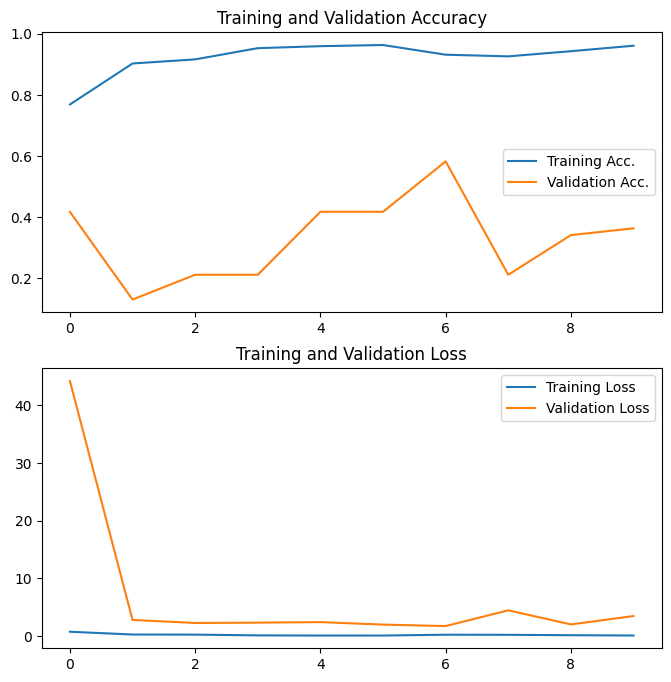

In [ ]:
hp.plot_training_history(history,lst_metrics[0])

In [ ]:
result = new_model.evaluate(test_generator, steps=steps_test)

99/99 [==============================] - 20s 205ms/step - loss: 3.0058 - sparse_categorical_accuracy: 0.4107


In [ ]:
result = new_model.evaluate(test_generator, steps=steps_test)
print("Test-set classification accuracy: {0:.2%}".format(result[1]))

99/99 [==============================] - 17s 175ms/step - loss: 3.0058 - sparse_categorical_accuracy: 0.4107
Test-set classification accuracy: 41.07%


##  Model validation

In [ ]:
test_history = new_model.predict(
                        test_generator,
                        steps=steps_test,
                        callbacks=None,
                        max_queue_size=10,
                        workers=-1,
                        use_multiprocessing=False,
                        verbose=1)

99/99 [==============================] - 19s 185ms/step


..................................................
showing test metrics for 3165 samples
``````````````````````````````````````````````````
                         
precision_macro  0.447446
accuracy         0.410742
f1_micro         0.410742
precision_micro  0.410742
recall_micro     0.410742
recall_macro     0.288202
f1_macro         0.254701
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


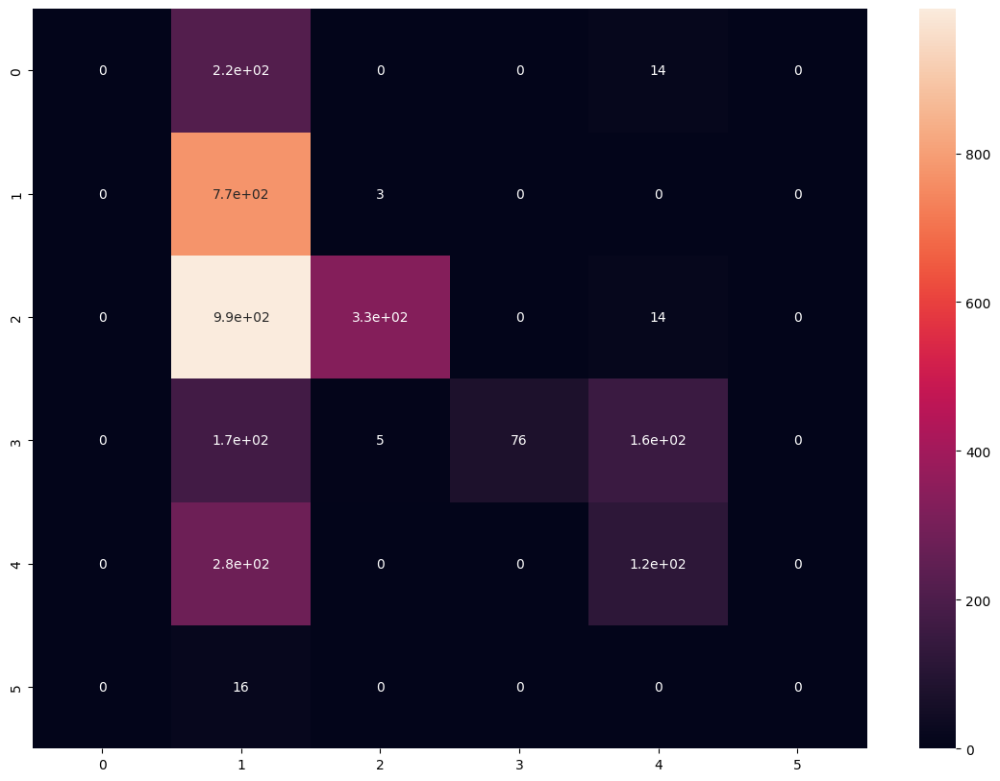

- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 


In [ ]:
df_res_labels = hp.create_test_report(test_generator, test_history)

Looks like our model is learning something, just not enough.

Now its your turn. Fine tune the model to achieve a better accuracy!

## Fine-Tuning
### What is Fine-tuning ?

Fine-tuning is a way of applying or utilizing transfer learning.

Specifically, fine-tuning is a process that takes a model that has already been trained for one given task and then tunes or tweaks the model to make it perform a second similar task.


### How to Fine-tune?
- We can fine-tune our transfer model to our unique data by slowly unfreezing the gradients of the convolutional layers as we train

- First, we start by loading our model and changing the last layer

- Then, after each epoch of training, we can begin updating the weights of the next convolutional layer

- You can slowly update the gradients starting with the lowest level layers and working our way to the top. This keeps a lot of the information our model has from the pre-trained weights, while helping fine-tune it to our book covers.

- After training and testing, you can compare it to your original network

